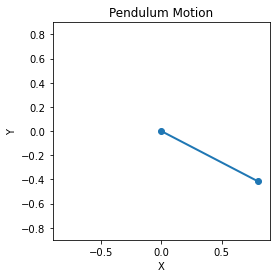

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Constants
L = 0.9  # Length of the pendulum
g = 9.8  # Acceleration due to gravity

# Initial conditions
theta0 = np.pi / 4  # Initial angle (in radians)
omega0 = 0.0  # Initial angular velocity (in rad/s)

# Time parameters
dt = 0.01  # Time step (in seconds)
t_max = 10.0  # Maximum simulation time (in seconds)

# Function to calculate the pendulum motion
def pendulum_motion(theta, omega):
    alpha = -g / L * np.sin(theta)
    return omega, alpha

# Function to update the pendulum state
def update_pendulum(state, dt):
    theta, omega = state
    dtheta, domega = pendulum_motion(theta, omega)
    theta_new = theta + dtheta * dt
    omega_new = omega + domega * dt
    return theta_new, omega_new

# Initialize arrays to store the pendulum state
theta_values = [theta0]
omega_values = [omega0]
t_values = [0.0]

# Perform the simulation
t = 0.0
theta = theta0
omega = omega0
while t < t_max:
    theta, omega = update_pendulum((theta, omega), dt)
    t += dt
    theta_values.append(theta)
    omega_values.append(omega)
    t_values.append(t)

# Convert polar coordinates to Cartesian coordinates
x_values = L * np.sin(theta_values)
y_values = -L * np.cos(theta_values)

# Create a figure and axes
fig, ax = plt.subplots()
ax.set_aspect('equal')
ax.set_xlim(-L, L)
ax.set_ylim(-L, L)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Pendulum Motion')

# Create a line object for the pendulum
line, = ax.plot([], [], 'o-', lw=2)

# Function to update the animation frame
def update_frame(i):
    line.set_data([0, x_values[i]], [0, y_values[i]])
    return line,

# Create the animation
animation = FuncAnimation(fig, update_frame, frames=len(t_values), interval=10, blit=True)

# Display the animation
from IPython.display import HTML
HTML(animation.to_jshtml())
